In [1]:
from keras.applications import vgg16
from keras.preprocessing.image import load_img,img_to_array
from keras.models import Model
from keras.applications.imagenet_utils import preprocess_input

from PIL import Image
import os
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

Using TensorFlow backend.


In [2]:
# parameters setup

imgs_path = "C:/Users/siddh/Desktop/ADS/train"

imgs_model_width, imgs_model_height = 224, 224

nb_closest_images = 5 # number of most similar images to retrieve

In [3]:
vgg_model = vgg16.VGG16(weights='imagenet')

# remove the last layers in order to get features instead of predictions
feat_extractor = Model(inputs=vgg_model.input, outputs=vgg_model.get_layer("fc2").output)

# print the layers of the CNN
feat_extractor.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [4]:
# List of training Images
files = [imgs_path + '/' + x for x in os.listdir(imgs_path) if "jpg" in x]
print("Number of Images:",len(files))

Number of Images: 1205


In [5]:
# Coverting and preprcessing Images and returning a feature set using the Neural Network
def preprocessimg(testpath):
    importedImages = []

    for f in testpath:
        filename = f
        original = load_img(filename, target_size=(224, 224))
        numpy_image = img_to_array(original)
        image_batch = np.expand_dims(numpy_image, axis=0)
        importedImages.append(image_batch)
    
    images = np.vstack(importedImages)
    processed_imgs = preprocess_input(images.copy())
    # extract the images features
    imgs_features = feat_extractor.predict(processed_imgs)
    return imgs_features

In [6]:
def findcossim(X,Y,files_te):
    # compute cosine similarities between images
    cosSimilarities = cosine_similarity(X, Y)
    # store the results into a pandas dataframe
    cos_similarities_df = pd.DataFrame(cosSimilarities,columns=files_te,index=files)
    return cos_similarities_df

In [7]:
def retrieve_most_similar_products(given_img,cos_similarities_df):
    print("-----------------------------------------------------------------------")
    print("Original Product:")

    original = load_img(given_img, target_size=(imgs_model_width, imgs_model_height))
    plt.imshow(original)
    plt.show()

    print("-----------------------------------------------------------------------")
    print("Most Similar Products:")

    
    closest_imgs = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1].index
    closest_imgs_scores = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1]

    for i in range(0,len(closest_imgs)):
        original = load_img(closest_imgs[i], target_size=(imgs_model_width, imgs_model_height))
        plt.imshow(original)
        plt.show()
        print("Similarity score : ",closest_imgs_scores[i])

In [8]:
def findallsim(files_test):
    for i in range(len(files_test)):
        retrieve_most_similar_products(files_test[i],cos_similarities_df)

## Traning the network

In [9]:
X=preprocessimg(files)
X.shape

(1205, 4096)

## Getting test Images Using the categories 

In [10]:
def choosecat(Category):
    imgs_path_test = "C:/Users/siddh/Desktop/ADS/test/"+Category
    files_test = [imgs_path_test + '/' + x for x in os.listdir(imgs_path_test) if "jpeg" or 'jpg' in x]
    print("number of images:",len(files_test))
    return files_test

## Shoes

In [11]:
#Preprocessing and feature extraction
# For running just copy the variable for the category 
files_test1=choosecat('Shoes')
test_image_features=preprocessimg(files_test1)
test_image_features.shape
# Cosine Similarity
cos_similarities_df=findcossim(X,test_image_features,files_test1)
cos_similarities_df.head()

number of images: 5


,C:/Users/siddh/Desktop/ADS/test/Shoes/134.jpg,C:/Users/siddh/Desktop/ADS/test/Shoes/71.jpg,C:/Users/siddh/Desktop/ADS/test/Shoes/WhatsApp Image 2020-08-07 at 2.24.03 PM.jpeg,C:/Users/siddh/Desktop/ADS/test/Shoes/WhatsApp Image 2020-08-07 at 2.24.22 PM.jpeg,C:/Users/siddh/Desktop/ADS/test/Shoes/WhatsApp Image 2020-08-07 at 2.40.05 PM (2).jpeg
C:/Users/siddh/Desktop/ADS/train/1.jpg,0.214125,0.159541,0.148912,0.189231,0.233373
C:/Users/siddh/Desktop/ADS/train/10.jpg,0.163847,0.159522,0.192524,0.193970,0.155156
C:/Users/siddh/Desktop/ADS/train/100.jpg,0.586432,0.516534,0.410382,0.369903,0.459834
C:/Users/siddh/Desktop/ADS/train/1003.jpg,0.307724,0.269131,0.267954,0.223201,0.230483
C:/Users/siddh/Desktop/ADS/train/1004.jpg,0.216133,0.239490,0.421834,0.322059,0.270500


-----------------------------------------------------------------------
Original Product:


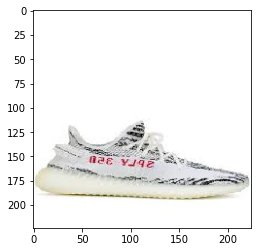

-----------------------------------------------------------------------
Most Similar Products:


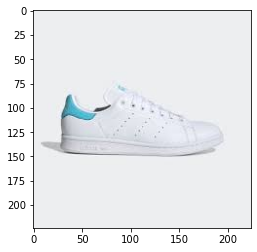

Similarity score :  0.83107525


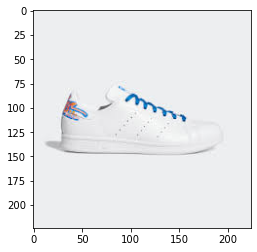

Similarity score :  0.8193062


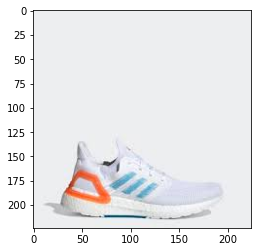

Similarity score :  0.8095425


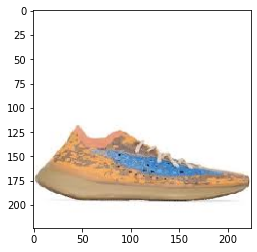

Similarity score :  0.79246366


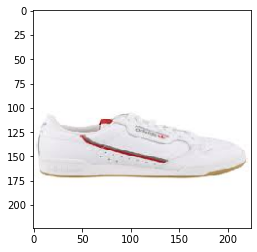

Similarity score :  0.7859094
-----------------------------------------------------------------------
Original Product:


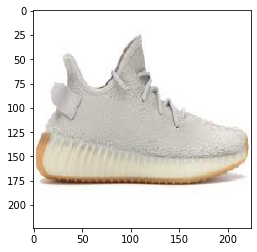

-----------------------------------------------------------------------
Most Similar Products:


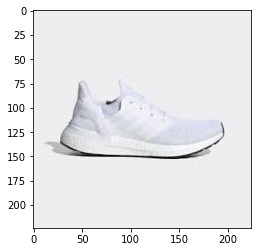

Similarity score :  0.7703906


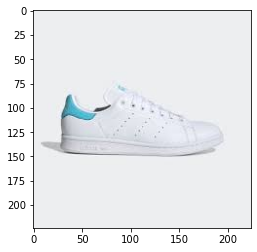

Similarity score :  0.7681698


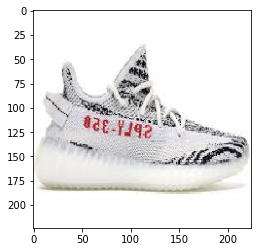

Similarity score :  0.7573821


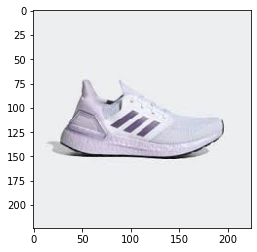

Similarity score :  0.75735724


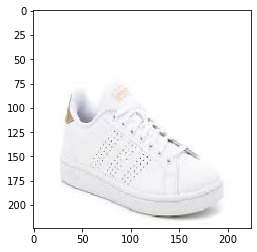

Similarity score :  0.73987544
-----------------------------------------------------------------------
Original Product:


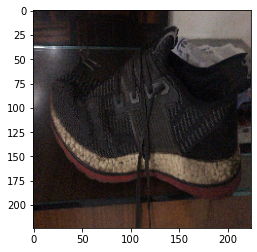

-----------------------------------------------------------------------
Most Similar Products:


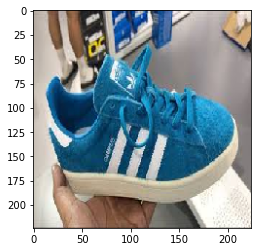

Similarity score :  0.49459475


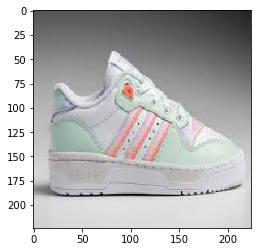

Similarity score :  0.48718113


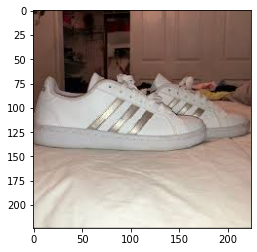

Similarity score :  0.4849683


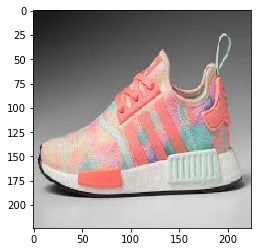

Similarity score :  0.48128664


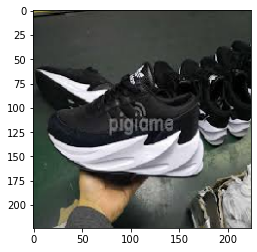

Similarity score :  0.4778198
-----------------------------------------------------------------------
Original Product:


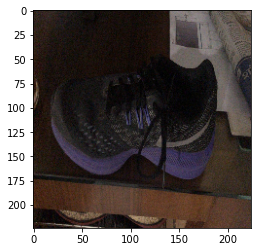

-----------------------------------------------------------------------
Most Similar Products:


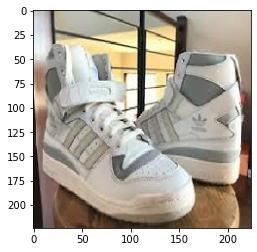

Similarity score :  0.4924612


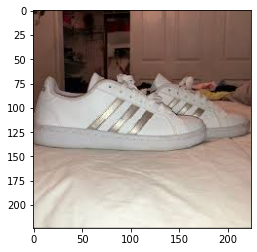

Similarity score :  0.4734593


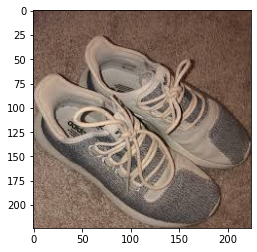

Similarity score :  0.45562822


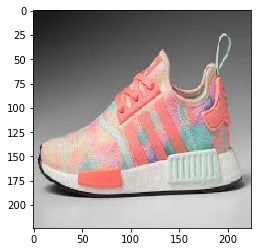

Similarity score :  0.43558672


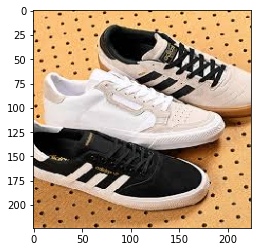

Similarity score :  0.4322552
-----------------------------------------------------------------------
Original Product:


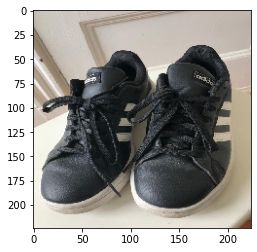

-----------------------------------------------------------------------
Most Similar Products:


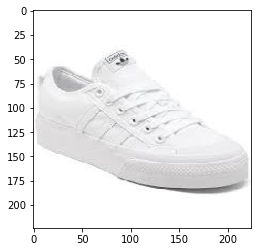

Similarity score :  0.64694273


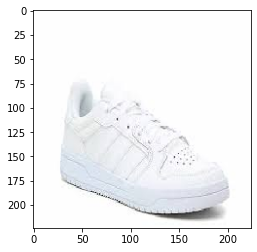

Similarity score :  0.6168665


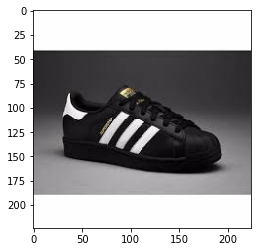

Similarity score :  0.61539495


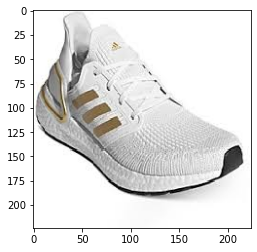

Similarity score :  0.5891945


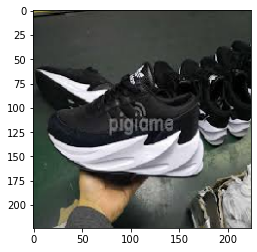

Similarity score :  0.58774555


In [12]:
findallsim(files_test1)

## Watches

In [13]:
#Preprocessing and feature extraction
# For running just copy the variable for the category 
files_test2=choosecat('Watches')
test_image_features=preprocessimg(files_test2)
test_image_features.shape
# Cosine Similarity
cos_similarities_df=findcossim(X,test_image_features,files_test2)
cos_similarities_df.head()

number of images: 5


,C:/Users/siddh/Desktop/ADS/test/Watches/3.jpg,C:/Users/siddh/Desktop/ADS/test/Watches/4.jpg,C:/Users/siddh/Desktop/ADS/test/Watches/WhatsApp Image 2020-08-07 at 2.23.41 PM (2).jpeg,C:/Users/siddh/Desktop/ADS/test/Watches/WhatsApp Image 2020-08-07 at 2.23.41 PM.jpeg,C:/Users/siddh/Desktop/ADS/test/Watches/WhatsApp Image 2020-08-07 at 2.40.05 PM (1).jpeg
C:/Users/siddh/Desktop/ADS/train/1.jpg,0.723253,0.481437,0.195054,0.222970,0.226036
C:/Users/siddh/Desktop/ADS/train/10.jpg,0.268980,0.433413,0.585062,0.544583,0.600166
C:/Users/siddh/Desktop/ADS/train/100.jpg,0.252958,0.200705,0.224152,0.189341,0.156967
C:/Users/siddh/Desktop/ADS/train/1003.jpg,0.281123,0.199415,0.252370,0.152915,0.150994
C:/Users/siddh/Desktop/ADS/train/1004.jpg,0.144603,0.115630,0.277322,0.159908,0.130345


-----------------------------------------------------------------------
Original Product:


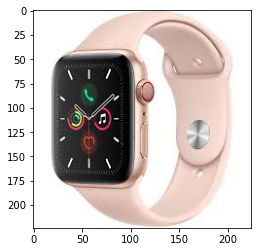

-----------------------------------------------------------------------
Most Similar Products:


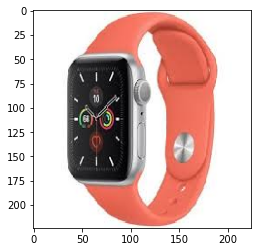

Similarity score :  0.812844


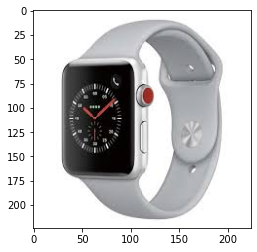

Similarity score :  0.78623927


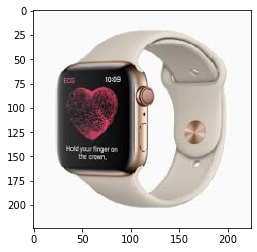

Similarity score :  0.7783432


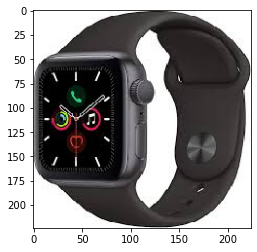

Similarity score :  0.76362014


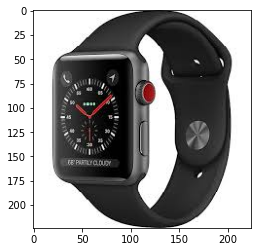

Similarity score :  0.7491771
-----------------------------------------------------------------------
Original Product:


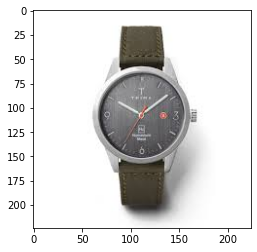

-----------------------------------------------------------------------
Most Similar Products:


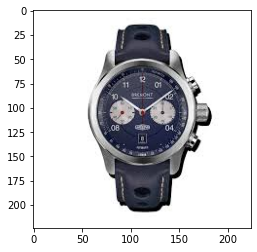

Similarity score :  0.7930441


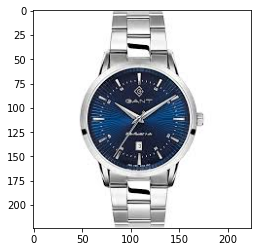

Similarity score :  0.74862343


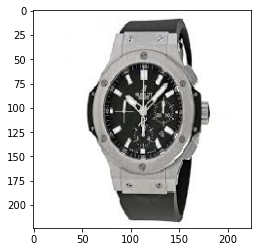

Similarity score :  0.741652


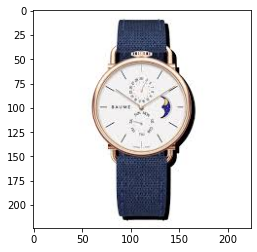

Similarity score :  0.731647


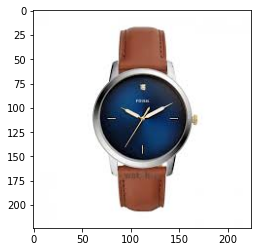

Similarity score :  0.7191041
-----------------------------------------------------------------------
Original Product:


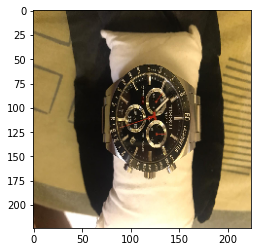

-----------------------------------------------------------------------
Most Similar Products:


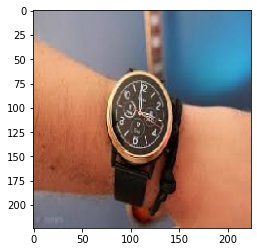

Similarity score :  0.58506227


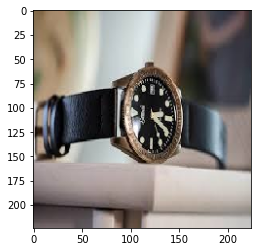

Similarity score :  0.57343024


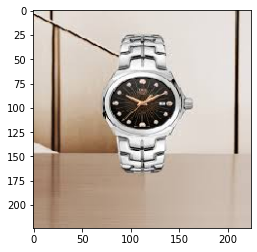

Similarity score :  0.5729381


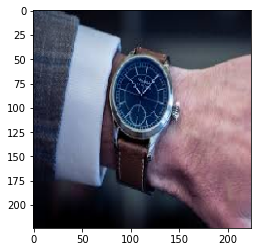

Similarity score :  0.54114586


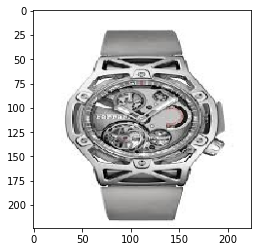

Similarity score :  0.53872466
-----------------------------------------------------------------------
Original Product:


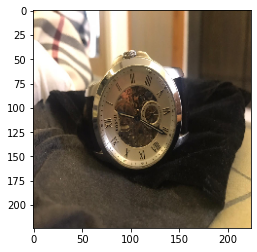

-----------------------------------------------------------------------
Most Similar Products:


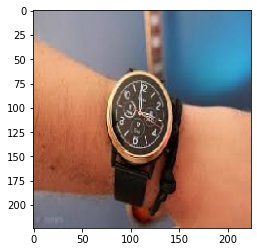

Similarity score :  0.54458344


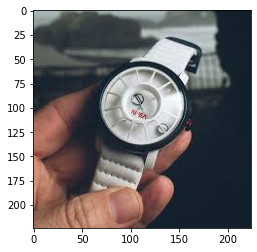

Similarity score :  0.5114395


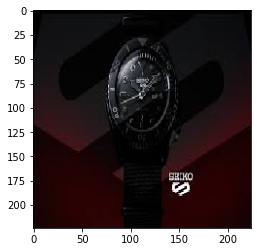

Similarity score :  0.5110008


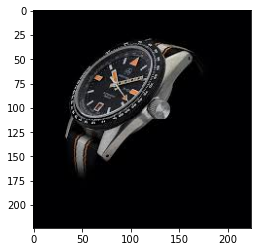

Similarity score :  0.50937325


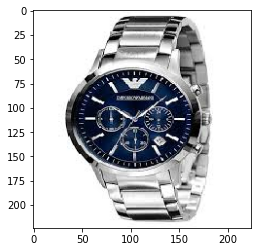

Similarity score :  0.50194514
-----------------------------------------------------------------------
Original Product:


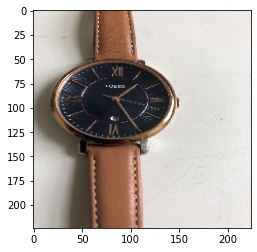

-----------------------------------------------------------------------
Most Similar Products:


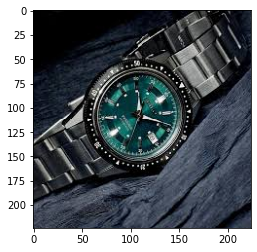

Similarity score :  0.61606705


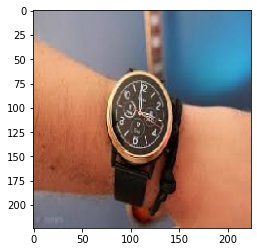

Similarity score :  0.60016626


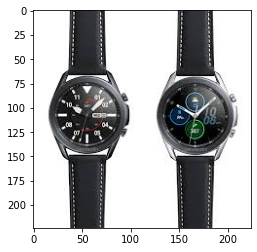

Similarity score :  0.58903134


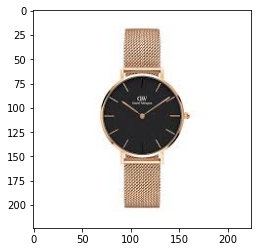

Similarity score :  0.5824759


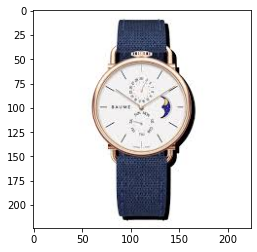

Similarity score :  0.56634235


In [14]:
findallsim(files_test2)

## Wallets

In [15]:
#Preprocessing and feature extraction
# For running just copy the variable for the category 
files_test3=choosecat('Wallets')
test_image_features=preprocessimg(files_test3)
test_image_features.shape
# Cosine Similarity
cos_similarities_df=findcossim(X,test_image_features,files_test3)
cos_similarities_df.head()

number of images: 5


,C:/Users/siddh/Desktop/ADS/test/Wallets/354.jpg,C:/Users/siddh/Desktop/ADS/test/Wallets/355.jpg,C:/Users/siddh/Desktop/ADS/test/Wallets/WhatsApp Image 2020-08-07 at 1.30.39 PM.jpeg,C:/Users/siddh/Desktop/ADS/test/Wallets/WhatsApp Image 2020-08-07 at 1.31.36 PM.jpeg,C:/Users/siddh/Desktop/ADS/test/Wallets/WhatsApp Image 2020-08-07 at 2.23.39 PM.jpeg
C:/Users/siddh/Desktop/ADS/train/1.jpg,0.268884,0.182638,0.165554,0.223552,0.228526
C:/Users/siddh/Desktop/ADS/train/10.jpg,0.206951,0.207727,0.280980,0.249486,0.269325
C:/Users/siddh/Desktop/ADS/train/100.jpg,0.362321,0.420240,0.303735,0.289243,0.264605
C:/Users/siddh/Desktop/ADS/train/1003.jpg,0.282924,0.306462,0.170696,0.173125,0.253751
C:/Users/siddh/Desktop/ADS/train/1004.jpg,0.274235,0.330853,0.164937,0.215929,0.268964


-----------------------------------------------------------------------
Original Product:


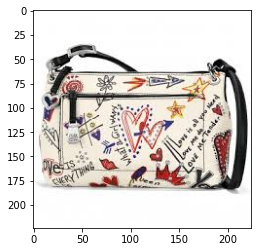

-----------------------------------------------------------------------
Most Similar Products:


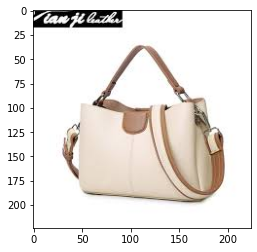

Similarity score :  0.52292603


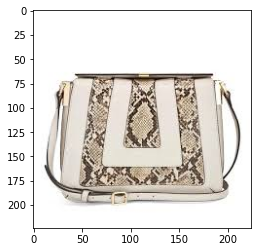

Similarity score :  0.51412404


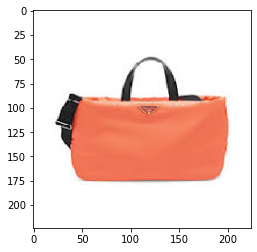

Similarity score :  0.50637907


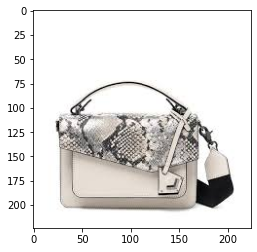

Similarity score :  0.5027829


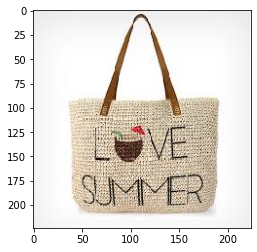

Similarity score :  0.49055266
-----------------------------------------------------------------------
Original Product:


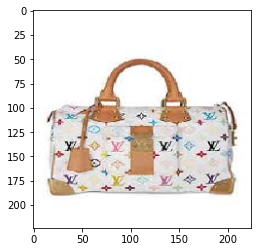

-----------------------------------------------------------------------
Most Similar Products:


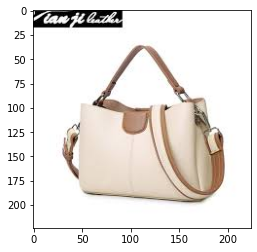

Similarity score :  0.72024786


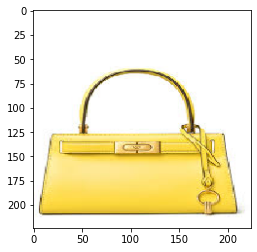

Similarity score :  0.7172767


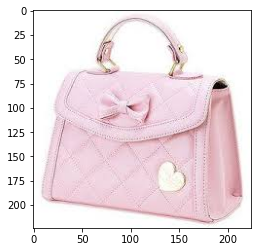

Similarity score :  0.704141


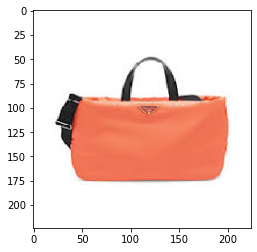

Similarity score :  0.70410997


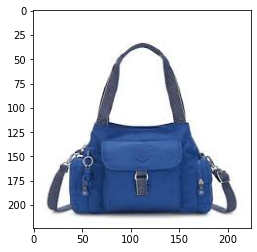

Similarity score :  0.6967
-----------------------------------------------------------------------
Original Product:


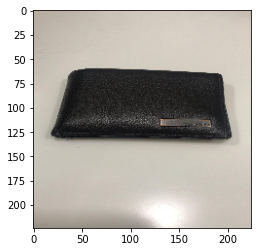

-----------------------------------------------------------------------
Most Similar Products:


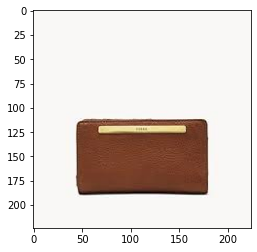

Similarity score :  0.701947


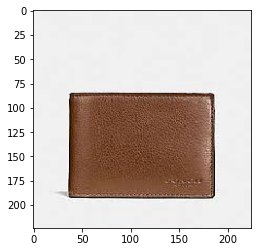

Similarity score :  0.70011777


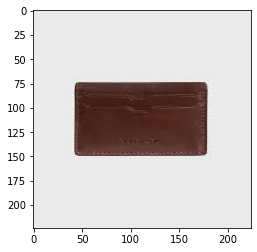

Similarity score :  0.69318676


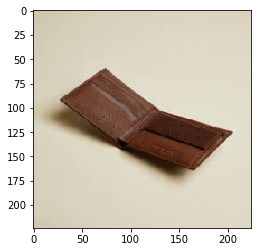

Similarity score :  0.68966174


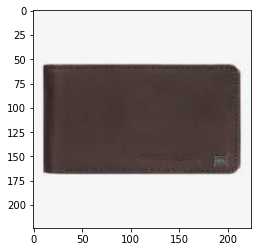

Similarity score :  0.6784149
-----------------------------------------------------------------------
Original Product:


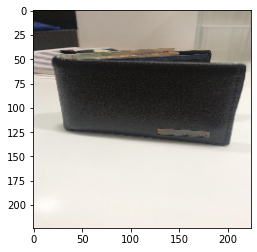

-----------------------------------------------------------------------
Most Similar Products:


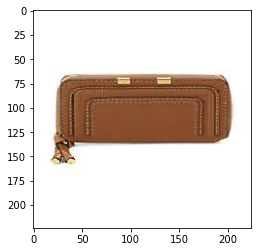

Similarity score :  0.5359256


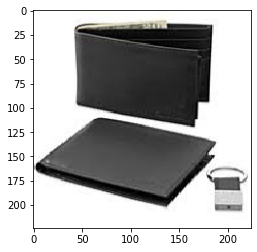

Similarity score :  0.5324879


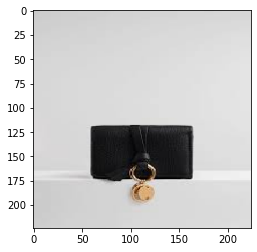

Similarity score :  0.53041106


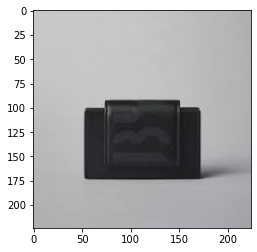

Similarity score :  0.52728856


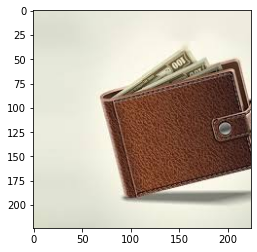

Similarity score :  0.5239169
-----------------------------------------------------------------------
Original Product:


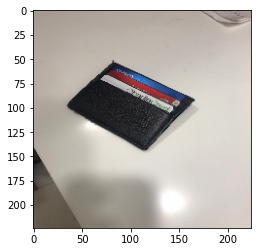

-----------------------------------------------------------------------
Most Similar Products:


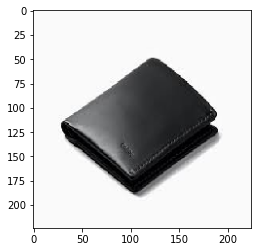

Similarity score :  0.55534464


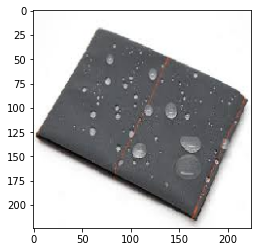

Similarity score :  0.5550126


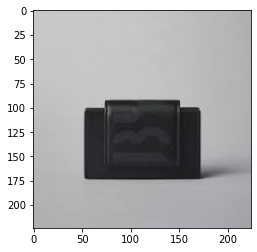

Similarity score :  0.5519546


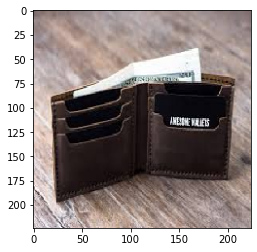

Similarity score :  0.54669726


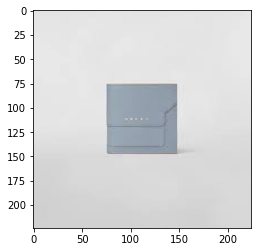

Similarity score :  0.5413616


In [16]:
findallsim(files_test3)

## Mens Tshirt

In [17]:
#Preprocessing and feature extraction
# For running just copy the variable for the category 
files_test4=choosecat('Men\'s Tshirt')
test_image_features=preprocessimg(files_test4)
test_image_features.shape
# Cosine Similarity
cos_similarities_df=findcossim(X,test_image_features,files_test4)
cos_similarities_df.head()

number of images: 5


,C:/Users/siddh/Desktop/ADS/test/Men's Tshirt/608.jpg,C:/Users/siddh/Desktop/ADS/test/Men's Tshirt/610.jpg,C:/Users/siddh/Desktop/ADS/test/Men's Tshirt/630.jpg,C:/Users/siddh/Desktop/ADS/test/Men's Tshirt/WhatsApp Image 2020-08-07 at 2.23.41 PM (1).jpeg,C:/Users/siddh/Desktop/ADS/test/Men's Tshirt/WhatsApp Image 2020-08-07 at 2.23.42 PM.jpeg
C:/Users/siddh/Desktop/ADS/train/1.jpg,0.119434,0.153061,0.147221,0.115021,0.111219
C:/Users/siddh/Desktop/ADS/train/10.jpg,0.141376,0.135279,0.129339,0.182456,0.152269
C:/Users/siddh/Desktop/ADS/train/100.jpg,0.175592,0.290064,0.265897,0.313054,0.283970
C:/Users/siddh/Desktop/ADS/train/1003.jpg,0.161480,0.250932,0.294042,0.295846,0.271442
C:/Users/siddh/Desktop/ADS/train/1004.jpg,0.340064,0.366142,0.367041,0.335430,0.438439


-----------------------------------------------------------------------
Original Product:


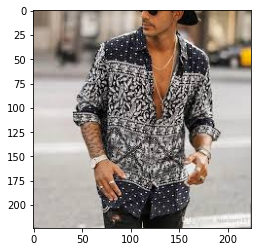

-----------------------------------------------------------------------
Most Similar Products:


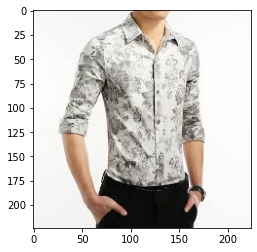

Similarity score :  0.58681405


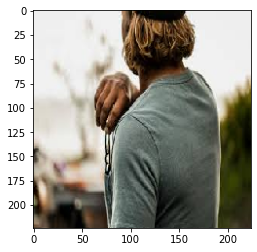

Similarity score :  0.5260901


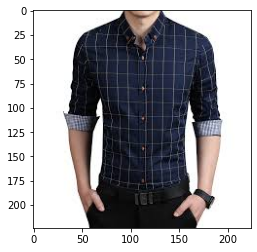

Similarity score :  0.52086836


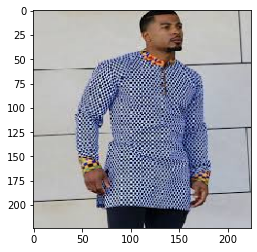

Similarity score :  0.5171116


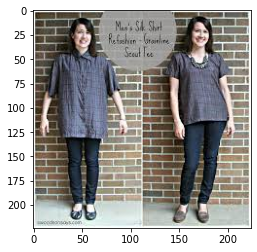

Similarity score :  0.51629627
-----------------------------------------------------------------------
Original Product:


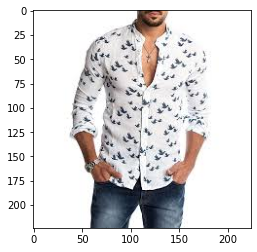

-----------------------------------------------------------------------
Most Similar Products:


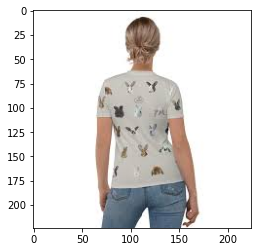

Similarity score :  0.78878736


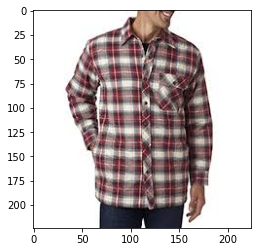

Similarity score :  0.7764181


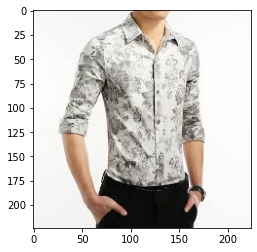

Similarity score :  0.7335124


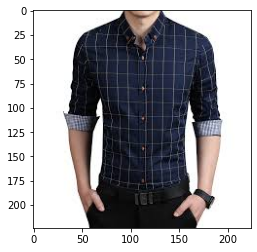

Similarity score :  0.7301648


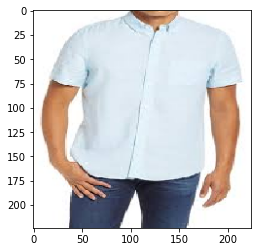

Similarity score :  0.72701883
-----------------------------------------------------------------------
Original Product:


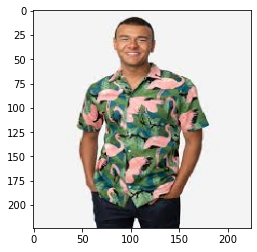

-----------------------------------------------------------------------
Most Similar Products:


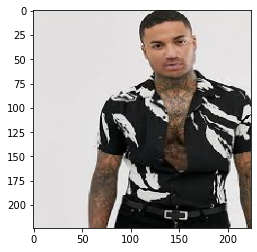

Similarity score :  0.7052891


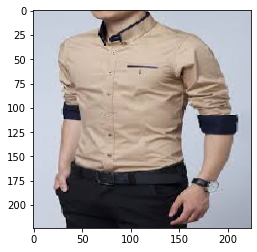

Similarity score :  0.7027002


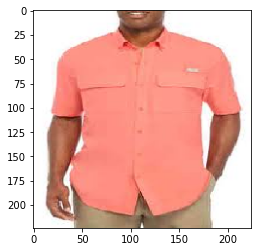

Similarity score :  0.6979035


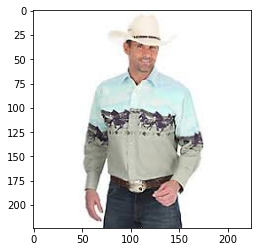

Similarity score :  0.6917367


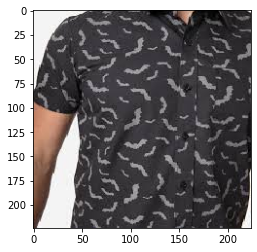

Similarity score :  0.6534436
-----------------------------------------------------------------------
Original Product:


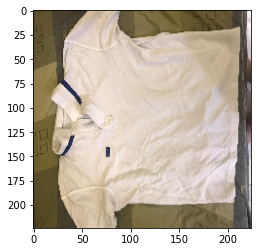

-----------------------------------------------------------------------
Most Similar Products:


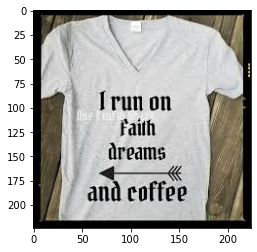

Similarity score :  0.55248576


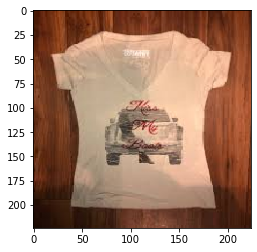

Similarity score :  0.5092727


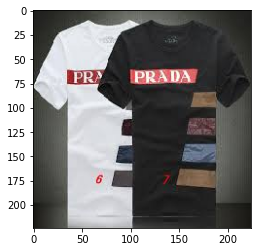

Similarity score :  0.503268


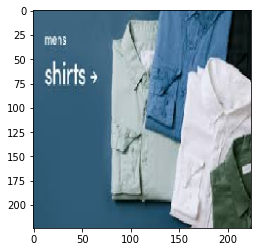

Similarity score :  0.49504936


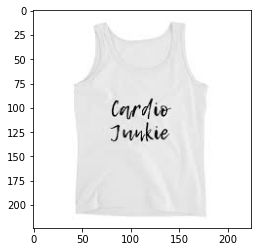

Similarity score :  0.49034736
-----------------------------------------------------------------------
Original Product:


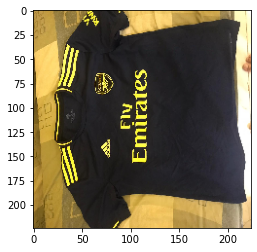

-----------------------------------------------------------------------
Most Similar Products:


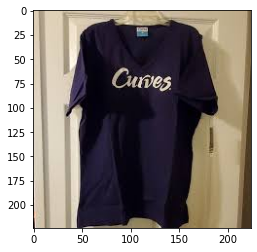

Similarity score :  0.61767054


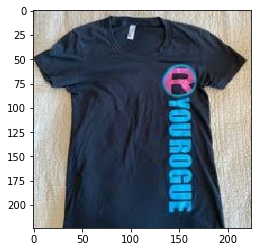

Similarity score :  0.6139606


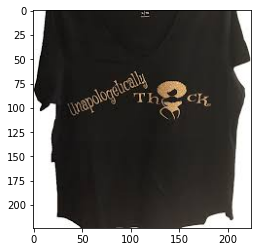

Similarity score :  0.5965195


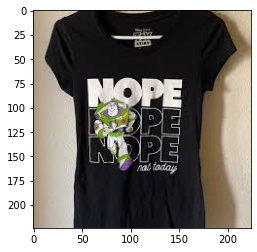

Similarity score :  0.58526784


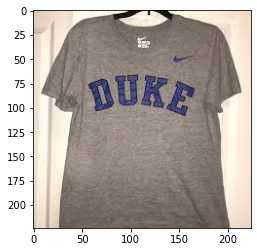

Similarity score :  0.58223903


In [18]:
findallsim(files_test4)

## Womens Tshirt

In [19]:
#Preprocessing and feature extraction
# For running just copy the variable for the category 
files_test5=choosecat('Women\'s Tshirt')
test_image_features=preprocessimg(files_test5)
test_image_features.shape
# Cosine Similarity
cos_similarities_df=findcossim(X,test_image_features,files_test5)
cos_similarities_df.head()

number of images: 5


,C:/Users/siddh/Desktop/ADS/test/Women's Tshirt/1091.jpg,C:/Users/siddh/Desktop/ADS/test/Women's Tshirt/1119.jpg,C:/Users/siddh/Desktop/ADS/test/Women's Tshirt/1167.jpg,C:/Users/siddh/Desktop/ADS/test/Women's Tshirt/WhatsApp Image 2020-08-07 at 2.40.05 PM (3).jpeg,C:/Users/siddh/Desktop/ADS/test/Women's Tshirt/WhatsApp Image 2020-08-07 at 2.40.05 PM (4).jpeg
C:/Users/siddh/Desktop/ADS/train/1.jpg,0.192905,0.210117,0.177749,0.114050,0.155100
C:/Users/siddh/Desktop/ADS/train/10.jpg,0.222061,0.188218,0.135503,0.148419,0.133351
C:/Users/siddh/Desktop/ADS/train/100.jpg,0.321728,0.285046,0.279574,0.241295,0.279468
C:/Users/siddh/Desktop/ADS/train/1003.jpg,0.303563,0.364390,0.289166,0.205834,0.247462
C:/Users/siddh/Desktop/ADS/train/1004.jpg,0.411358,0.418510,0.357972,0.390646,0.337486


-----------------------------------------------------------------------
Original Product:


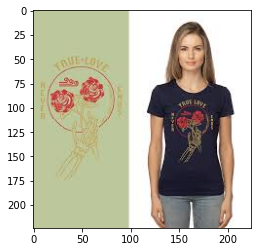

-----------------------------------------------------------------------
Most Similar Products:


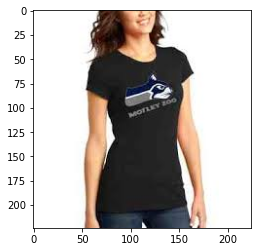

Similarity score :  0.8097531


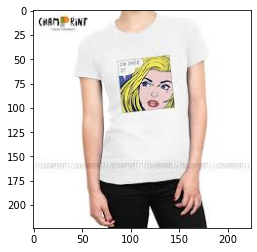

Similarity score :  0.78520447


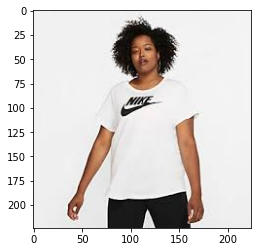

Similarity score :  0.78457016


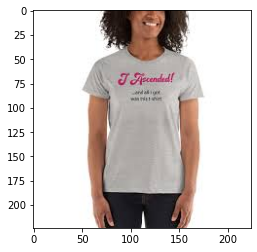

Similarity score :  0.78373325


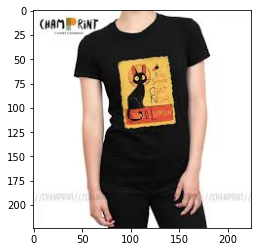

Similarity score :  0.7810737
-----------------------------------------------------------------------
Original Product:


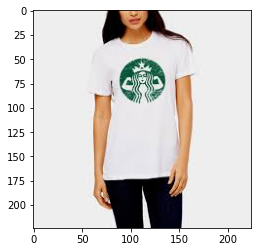

-----------------------------------------------------------------------
Most Similar Products:


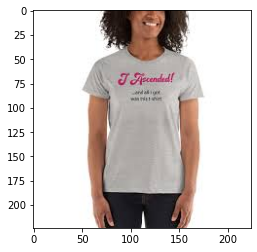

Similarity score :  0.8340442


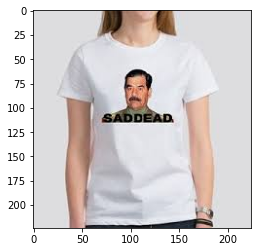

Similarity score :  0.8274727


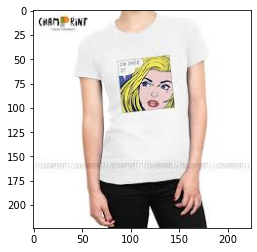

Similarity score :  0.8270395


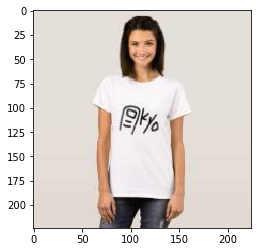

Similarity score :  0.82593596


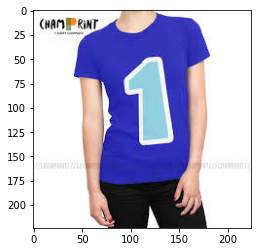

Similarity score :  0.8172991
-----------------------------------------------------------------------
Original Product:


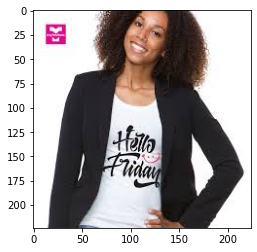

-----------------------------------------------------------------------
Most Similar Products:


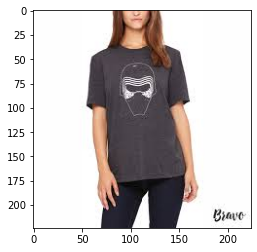

Similarity score :  0.7232962


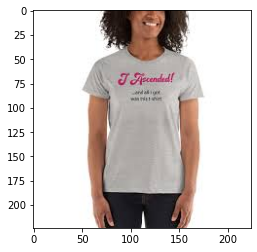

Similarity score :  0.7167773


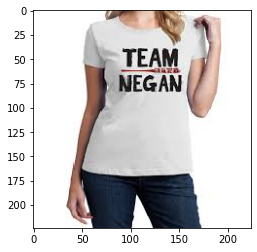

Similarity score :  0.71304137


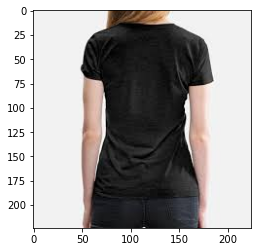

Similarity score :  0.7106831


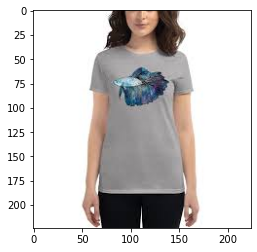

Similarity score :  0.7054152
-----------------------------------------------------------------------
Original Product:


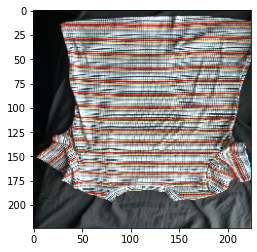

-----------------------------------------------------------------------
Most Similar Products:


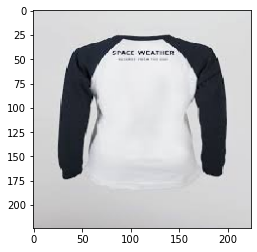

Similarity score :  0.4467111


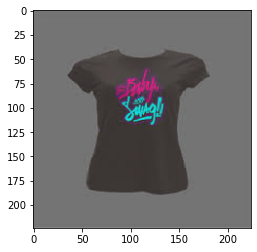

Similarity score :  0.44629988


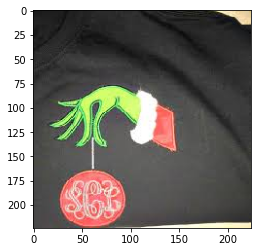

Similarity score :  0.43145117


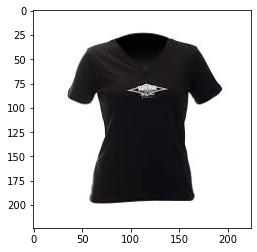

Similarity score :  0.41506496


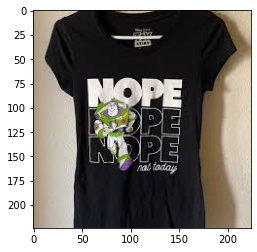

Similarity score :  0.41488612
-----------------------------------------------------------------------
Original Product:


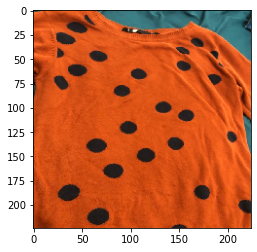

-----------------------------------------------------------------------
Most Similar Products:


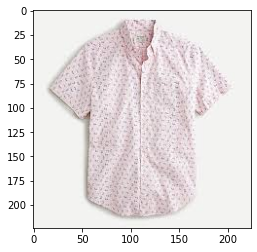

Similarity score :  0.4607698


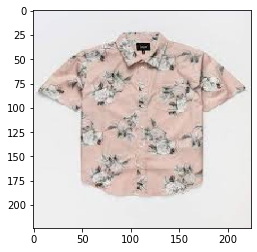

Similarity score :  0.4596846


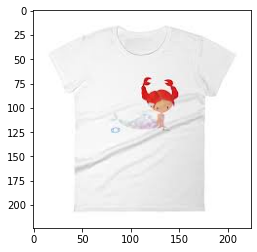

Similarity score :  0.4574648


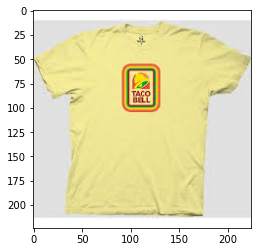

Similarity score :  0.45263055


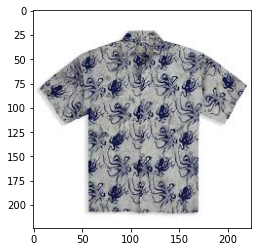

Similarity score :  0.45171425


In [20]:
findallsim(files_test5)